# Act 4: Leaving Earth
#####  ~   (bye Earth!)  ~

As a next step for our TNO movie, it's our goal to "leave earth". This includes animating the transition from Earth to birds-eye view, visualizing all TNOs as complete orbits, incorporating part of the solar system for more context, and manipulating Mellenger to accurately represent our final viewpoint.

In [5]:
# import useful classes
from importlib import reload
import orbitdot
from orbitdot import Orbit, Dot, getPlanetPos
import timeline
from timeline import Timeline
import observer
from observer import Observer
reload(observer)
# matplotlib + animating
import matplotlib
from matplotlib import cm
import matplotlib.pyplot as pl
from matplotlib import animation
from IPython.display import Video
from matplotlib.animation import FuncAnimation
# astropy
import astropy
from astropy import wcs
import astropy.table as tb
from astropy.wcs import WCS
from astropy.io import fits
import astropy.io.fits as pf
from astropy.time import Time
from astropy.utils.data import get_pkg_data_filename
from astropy.coordinates import solar_system_ephemeris, EarthLocation, get_body_barycentric
# others
import math
import scipy
import numpy as np
import reproject as rp
from scipy import ndimage
import transformation as tr
from jupyterthemes import jtplot
jtplot.style(ticks=True, grid=False)

In [27]:
# import useful classes
#from importlib import reload
#import orbitdot
#from orbitdot import Orbit, Dot, getPlanetPos
reload(orbitdot)

<module 'orbitdot' from '/Users/saarahhall/Desktop/data visualization/orbitdot.py'>

In [8]:
def azp_wcs(ra0=20, dec0=-35, mu=1.2, pixscale=0.1,shape=(170.,100.)):
    '''Return a WCS realizing an azimuthal projection about the 
    specified RA & DEC (degrees) with specified `mu` value.
    `pixscale` is angular size of pixel at the pole
    `shape` is a 2-element array giving total extent of the field if an image is
    being made (using x,y convention).
    The defaults yield a nice view of the DES footprint.
    The return values are the wcs, and a tuple giving the shape
    of the (2d) resultant image field (in the y,x numpy convention).'''

    # Build the WCS as a header dictionary 
    npix1 = int(np.floor(shape[0]/pixscale))
    npix2 = int(np.floor(shape[1]/pixscale))
    h={'CTYPE1':'RA---AZP'}
    h['CTYPE2']='DEC--AZP'
    h['NAXIS']=2
    h['NAXIS1']=npix1
    h['NAXIS2']=npix2
    h['CRPIX1']=npix1/2+1
    h['CRPIX2']=npix2/2+1
    h['CRVAL1']=ra0
    h['CRVAL2']=dec0
    h['CDELT1']=pixscale
    h['CDELT2']=pixscale
    h['CUNIT1']='deg'
    h['CUNIT2']='deg'
    h['PV2_1']=mu
    return WCS(pf.Header(h)), (h['NAXIS2'],h['NAXIS1'])

In [10]:
# wcs we end up with in the previous Act
wcs,shape = azp_wcs(ra0=20, dec0=-35, mu=1.2)
# zenithal projection of mellinger, rgb2 is given to imshow
rgb = pl.imread('dataa/melbig.jpg')
melwcs = WCS(pf.Header.fromfile('/Users/saarahhall/Desktop/data visualization/dataa/melbig.wcs'))
rgb2=[]
for c in range(3):
    a,f = rp.reproject_interp((rgb[:,:,c],melwcs),wcs,shape_out=shape,return_footprint=True)
    rgb2.append(a.astype(np.uint8,casting='unsafe'))
rgb2 = np.stack(rgb2)
rgb2 = np.moveaxis(rgb2,0,2)
# crop as done in previous Act
rgb2_crop = rgb2[int(43):int(1000),int(0):int(1700)]
finalwcs = wcs[int(43):int(1000),int(0):int(1700)]

# DES footprint
ra,dec = np.loadtxt('round17-poly.txt',comments='#',unpack=True)
x,y = finalwcs.all_world2pix(ra,dec,0)

# colorbar values
cmap = matplotlib.cm.Spectral
alltnoi = tb.Table.read('dataa/y4_tno_table.fits')
min_d = alltnoi['d'][(alltnoi['d'] < 28)][0]
norm = matplotlib.colors.Normalize(vmin=min_d, vmax=55)

In [14]:
# all TNO orbits
allIDs = range(0,718)
allorbs = [Orbit(allIDs[k]) for k in range(len(allIDs))]
start, span = 2013, 6
allinfos = [allorbs[j].getPath(start,span) for j in range(len(allorbs))]
givecolors = [matplotlib.cm.Spectral(allorbs[o].color_val) for o in range(len(allIDs))]
# positions in (x,y,z) to hand to observer
alltno_pos = [allinfos[j][4] for j in range(len(allorbs))]

### Act 4 Scene 1
##### Unsquiggle!
    Orbit, Observer, and getPlanetPos inter values are 70 here. After the lines straighten out we can decrease inter, more and more so as we zoom farther away

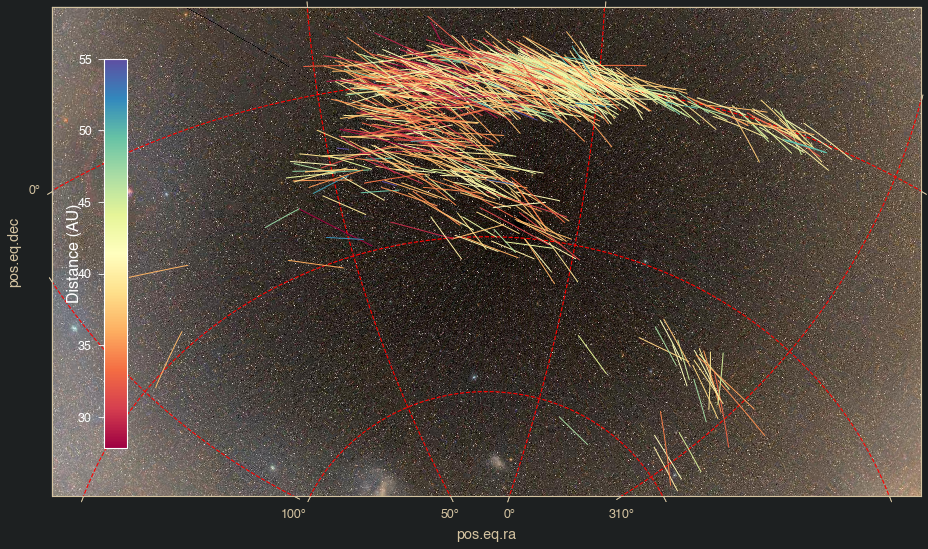

In [16]:
# show the image
fig = pl.figure(figsize=(16,9))
ax = pl.subplot(projection=finalwcs)
ax.imshow(rgb2_crop)

# draw coordinate grid
ax.coords.grid(True, color='red', ls='--')
ax.coords[0].set_format_unit('deg', decimal=True)
ax.set_xlim(ax.get_xlim()[::-1])

# colorbar in frame
cax = fig.add_axes([0.18, 0.2, 0.02, 0.6])
cb = matplotlib.colorbar.ColorbarBase(cax, cmap=cmap,norm=norm,orientation='vertical')
cb.set_label('Distance (AU)', labelpad = -60)
cb.ax.yaxis.label.set_color('white')
cb.ax.yaxis.label.set_font_properties(matplotlib.font_manager.FontProperties(size=16))
cb.ax.tick_params(axis='y', colors='white')
cb.outline.set_edgecolor('white')
cax.yaxis.set_ticks_position('left')

# load up places to update line data
points = [ax.plot([], [], '-', lw=1, color=givecolors[i])[0] for i in range(len(allorbs))]
xdata = [[] for i in range(len(allorbs))]
ydata = [[] for i in range(len(allorbs))]

# animate the Observer's changing perspective by shrinking p_factor to zero (class function wcsStretch)
def init():
    return points
def animate(i):       
    Observer(1,0).wcsStretch(points, xdata, ydata, alltno_pos, start, span, finalwcs, i)
    return points

# save the video
Writer = animation.writers['ffmpeg']
writer = Writer(fps=(30), metadata=dict(artist='Me'), bitrate=1800)

ani = animation.FuncAnimation(fig, animate, frames=100, init_func=init, blit=True)
ani.save("a4s1.mp4", writer=writer, dpi=80)
Video("a4s1.mp4")

### Act 4 Scene 2
##### fade in outer planets, their labels, and the sun
    colorbar fades out in post (crossfade in Premiere)

In [28]:
# load Nep-Jup positions
p_list = ['Neptune', 'Uranus', 'Saturn','Jupiter']
movie_p_pos = getPlanetPos(p_list, 1854, 165)
# plotting the sun (x.y.z = 0.0.0)
sunra = Observer(0,50).getVectors([(0,0,0)],2016,1)[0][0][0]
sundec = Observer(0,50).getVectors([(0,0,0)],2016,1)[1][0][0]
# sun pixel coords in current wcs
sunx,suny = finalwcs.all_world2pix(sunra,sundec,0)
# the positions of planet titles
textradec = Observer(0,0).getVectors(movie_p_pos, 1854, 165)

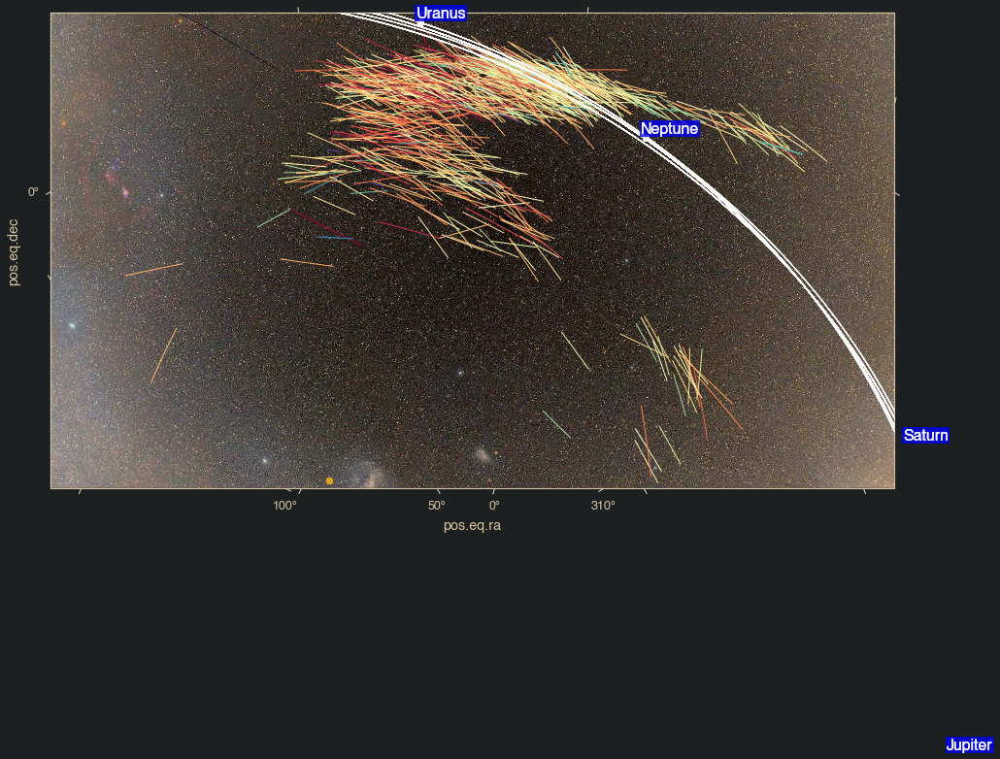

In [36]:
# project the image
fig = pl.figure(figsize=(16,9))
ax = pl.subplot(projection=finalwcs)
ax.imshow(rgb2_crop)

# formatting (no red dotted lines from old projection)
ax.autoscale(False)
ax.set_xlim(ax.get_xlim()[::-1])
ax.coords[0].set_format_unit('deg', decimal=True)

# plot the TNO orbits from Observer's current position, according to current wcs and frame number
Observer(0,0).wcsPlot(alltno_pos, 2013, 6, givecolors, ax, finalwcs)

frametot = 15
def init():
    return
def animate(i):
    alpha_ = (0 + (1/frametot)*i)
    # fading in: planet orbits, sun, titles
    ax.plot(sunx,suny, 'o', color='goldenrod', markersize=7, alpha = alpha_)
    # plot Jup-Nep with large points at current position
    Observer(0,0).wcsPlotHead(movie_p_pos, 1854, 165, ['white','white','white','white'], ax, 
                              finalwcs, alpha_)

    for p in range(len(textradec[0])):
        tx,ty = finalwcs.all_world2pix(textradec[0][p][-1],
                                       textradec[1][p][-1],0)
        ax.text(tx+10, ty+10, p_list[p], fontsize=16, color='white',alpha=alpha_,
        bbox={'facecolor': 'blue', 'alpha': (0+ (0.2/frametot)*i), 'pad': 1})
    return
        
anim = FuncAnimation(fig, animate, frames=frametot, interval=1, blit=False)
anim.save('a4s2.mp4', writer='ffmpeg', fps=20, dpi=80, bitrate=-1)
Video("a4s2.mp4")

### Act 4 Scene 3
##### liftoff! Update z_add and y_add on Observer (check for correct math)

    start:   ra0=20, dec=-35
    end:     ra0=90, dec0=-60 

In [37]:
def lift_both(factor, end_ra, end_dec, frametot):
    '''function for the transition from ~on the sun to above the sun
       incrementally updates the projected image, observer plots, and zoom
       - updates azp_wcs AND observer data so that the background image moves with the camera
       - factor: current frame "i"
    '''
    
    # update the image projection according to frame number
    wcs,shape = azp_wcs(ra0=(20+ ((end_ra-20)/frametot)*factor), 
                        dec0=(-35 + ((end_dec- -35)/frametot)*factor), mu=1.2)
    rgb2=[]
    for c in range(3):
        a,f = rp.reproject_interp((rgb[:,:,c],melwcs),wcs,shape_out=shape,return_footprint=True)
        rgb2.append(a.astype(np.uint8,casting='unsafe'))
    rgb2 = np.stack(rgb2)
    rgb2 = np.moveaxis(rgb2,0,2)

    # update the wcs crop (zoom in), fromt wcs[43:1000, 0:1700] to wcs[190:752, 350:1350]
    croppedwcs = wcs[int(43+((190-43)/frametot)*factor):int(1000 + ((752-1000)/frametot)*factor),
                  int((350/frametot)*factor):int(1700 + ((1350-1700)/frametot)*factor)]

    # project the image
    ax = pl.subplot(projection=croppedwcs)
    # as with the wcs crop, crop the image
    ax.imshow(rgb2[int(43+((190-43)/frametot)*factor):int(1000 + ((752-1000)/frametot)*factor),
                  int((350/frametot)*factor):int(1700 + ((1350-1700)/frametot)*factor)])
    
    # formatting
    ax.autoscale(False)
    ax.set_xlim(ax.get_xlim()[::-1])
    ax.coords[0].set_format_unit('deg', decimal=True)
    
    # plot the TNO orbits from Observer's current position, according to current wcs and frame number
    Observer(0,((100/frametot)*factor)).wcsPlot(alltno_pos, 2013, 6, givecolors, ax, croppedwcs)
    # plot the Sun (not via Observer, since it's only one point and is easily calculated)
    sunx,suny = croppedwcs.all_world2pix(sunra,sundec,0)
    ax.plot(sunx,suny, 'o', color='goldenrod', markersize=7)
    # plot Jup-Nep with large points at current position
    Observer(0,((100/frametot)*factor)).wcsPlotHead(movie_p_pos, 1854, 165, ['white','white','white','white'], 
                                                    ax, croppedwcs, 1)
    # give planets floating titles
    textradec = Observer(0,((100/frametot)*factor)).getVectors(movie_p_pos, 1854, 165)
    #textradec = Observer(0,((100/frametot)*factor)).getVectors(small_inter_pos, 1854, 165)
    for p in range(len(textradec[0])):
        tx,ty = croppedwcs.all_world2pix(textradec[0][p][-1],
                                       textradec[1][p][-1],0)
        ax.text(tx+10, ty+10, p_list[p], fontsize=16, color='white',
        bbox={'facecolor': 'blue', 'alpha': 0.2, 'pad': 1})

0


0


1


2


3


4


5


6


7


8


9


0


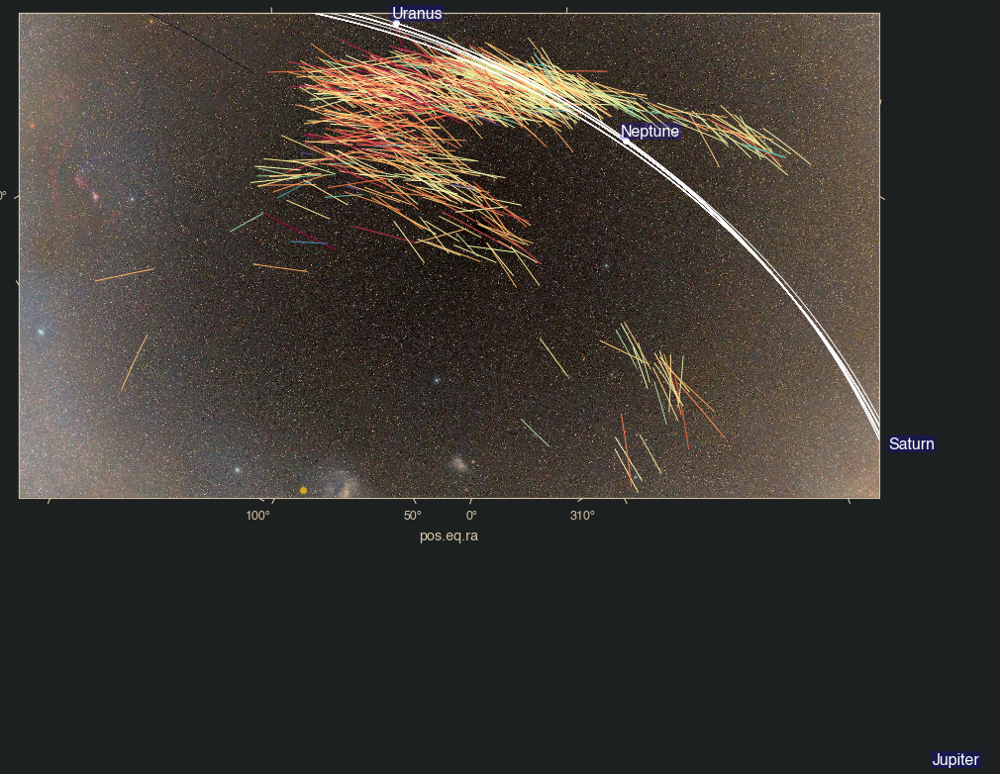

In [38]:
fig = pl.figure(figsize=(16,9))
frametot = 100 #increasing frametot makes a smoother video

def animate(i):
    im = lift_both(1*i, 90, -60, frametot)
    print(i)
anim = FuncAnimation(fig, animate, frames=frametot, interval=1, blit=False)
anim.save('liftoff.mp4', writer='ffmpeg', fps=30, dpi=80, bitrate=-1)
Video("liftoff.mp4")

*** 
The rest of Act 4: looking down on Orbits and running the clock


In [40]:
# wcs and image
wcs_above,shape_above = azp_wcs(ra0=90, dec0=-60, mu=1.2)
croppedwcs = wcs_above[190:752,350:1350] 
rgb = pl.imread('dataa/melbig.jpg')
melwcs = WCS(pf.Header.fromfile('/Users/saarahhall/Desktop/data visualization/dataa/melbig.wcs'))
rgb2_above=[]
for c in range(3):
        a,f = rp.reproject_interp((rgb[:,:,c],melwcs),wcs_above,shape_out=shape_above,return_footprint=True)
        rgb2_above.append(a.astype(np.uint8,casting='unsafe'))
rgb2_above = np.stack(rgb2_above)
rgb2_above = np.moveaxis(rgb2_above,0,2)
croppedmel = rgb2_above[190:752,350:1350]

# planet labels and Sun dot    
letter_list = ['N', 'U', 'S','J']
sunx,suny = croppedwcs.all_world2pix(sunra,sundec,0)

# 300 year timeline
tl300 = Timeline(start_4,start_4+span_4)

    For 300 years chunk, I decreased the "inter" value to 4.
    >> for variables where inter is 4, "variable name" + "_4"
    For 1000 year chunk, "inter" = 1
    >> for variables where inter is 1, "variable name" + "_1"
    For 6000 chunk, "inter" = 0.1
    >> for variables where inter is 0.1, "variable name" + "_01"

In [434]:
# Orbits (TNOs) with inter=4
neworbs_4 = [Orbit(allIDs[k]) for k in range(len(allIDs))]
start_4, span_4 = 2019, 300
infos_4 = [neworbs_4[j].getPath(start_4,span_4) for j in range(len(neworbs_4))]
tno_pos_4 = [infos_4[j][4] for j in range(len(neworbs_4))] #positions in (x,y,z)

# planets (Jup-Nep)
smallplanet_pos = getPlanetPos(['Neptune','Uranus','Saturn','Jupiter'], start_4, span_4)

# combining TNO and planet data to hand to Observer; all positions for 300 years
all_pos300 = tno_pos_4 + smallplanet_pos
all_colors = givecolors + ['white', 'white', 'white', 'white']

'''the meat and potatoes!
- all TNO and planet positions as seen by Observer
- + the previous 6 years of TNO data (continuity)'''

# all positions as seen by the Observer for the next 300 years, in pixel coordinates
tno_obs_4 = Observer(0,100).wcsPoints(all_pos300, start_4, span_4, croppedwcs)

# previously drawn orbits
last6infos_4 = [neworbs_4[j].getPath(2013,6) for j in range(len(neworbs_4))]
last6tno_pos_4 = [last6infos_4[j][4] for j in range(len(neworbs_4))] #positions in (x,y,z)
last6tno_obs_4 = Observer(0,100).wcsPoints(last6tno_pos_4,2013,6,croppedwcs)

# we introduced the planets as full orbits, so load "full" planet positions
fullp_pos_4 = getPlanetPos(['Neptune','Uranus','Saturn','Jupiter'], 1854, 165)
fullp_obs_4 = Observer(0,100).wcsPoints(fullp_pos_4, 1854, 165, croppedwcs)

# old x and y values (TNO and planets) to plot
oldx = last6tno_obs_4[0]+fullp_obs_4[0]
oldy = last6tno_obs_4[1]+fullp_obs_4[1]

### Act 4 Scene 4
##### Draw first part of 300 years section, stationary camera

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124


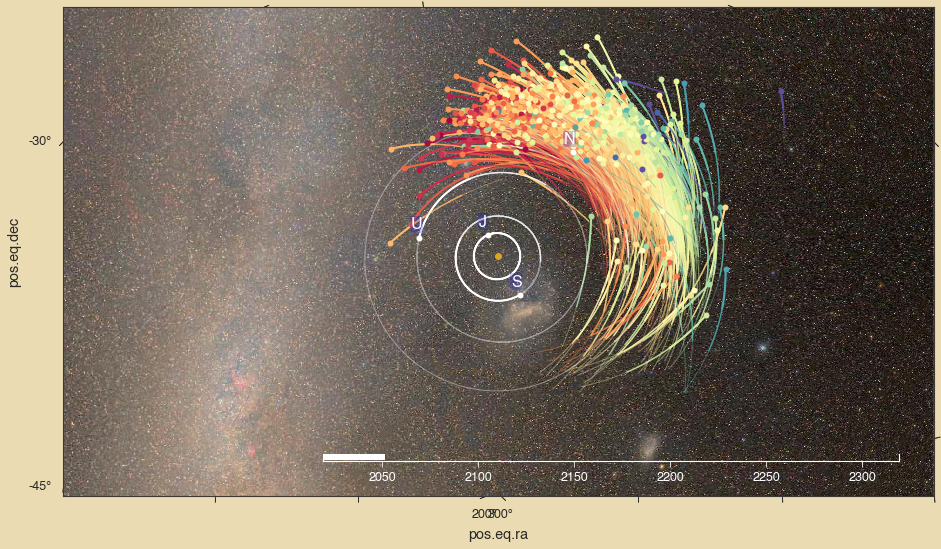

In [447]:
fig = pl.figure(figsize=(16,9))

# project cropped mellenger image
ax = pl.subplot(projection=croppedwcs)
ax.imshow(croppedmel)

# formatting
ax.autoscale(False)
ax.set_xlim(ax.get_xlim()[::-1])
ax.coords[0].set_format_unit('deg', decimal=True)
# plot the Timeline
tl300.plot(ax,0.36,0.18)
    
ax.plot(sunx,suny, 'o', color='goldenrod', markersize=7)
 
# 3 sets of "Line2D" objects, differing alpha and lw to create "tails"
points1 = [ax.plot([], [], '-', lw=2, color=all_colors[i], alpha=1)[0] for i in range(len(allorbs+letter_list))]
points2 = [ax.plot([], [], '-', lw=1.5, color=all_colors[i], alpha=0.8)[0] for i in range(len(allorbs+letter_list))]
points3 = [ax.plot([], [], '-', lw=1, color=all_colors[i], alpha=0.4)[0] for i in range(len(allorbs+letter_list))]
# the "heads" of each tail and the letter labels
points_t0 = [ax.plot([], [], 'o', markersize=6, color=all_colors[i])[0] for i in range(len(allorbs+letter_list))]
letters = [ax.text(0, 0, letter_list[i], fontsize=16, 
                   color='white', bbox={'facecolor': 'blue', 'alpha': 0.2, 'pad': 1}) for i in range(len(letter_list))]

# make blank lists for coordinate data, include the previously drawn values
xdata = [[] for i in range(len(allorbs+letter_list))]
ydata = [[] for i in range(len(allorbs+letter_list))]
for k in range(len(allorbs+letter_list)):
    for u in range(len(oldx[k])):
        xdata[k].append(oldx[k][u])
        ydata[k].append(oldy[k][u])

def init():
    return points

def animate(i):
    for o in range(len(allorbs+letter_list)):   
        x = tno_obs_4[0][o][i]
        y = tno_obs_4[1][o][i]
        xdata[o].append(x)
        ydata[o].append(y)
        # set different amounts of data to each "Line2D"
        points1[o].set_data(xdata[o][-50:], ydata[o][-50:])
        points2[o].set_data(xdata[o][-100:], ydata[o][-100:])
        points3[o].set_data(xdata[o], ydata[o])

        points_t0[o].set_data(x, y)
        # planets and their labels
        if o > 717:
            x = tno_obs_4[0][o][i]
            y = tno_obs_4[1][o][i]
            letters[o-718].set_position((x+10, y+10))
            
    #year span * inter value gives the amount of frames it takes to fill timeline = 1200
    tl300.time(i, 1200)
    print(i)
    return points

Writer = animation.writers['ffmpeg']
writer = Writer(fps=(60), metadata=dict(artist='Me'), bitrate=1800)

ani = animation.FuncAnimation(fig, animate, frames=125, init_func=init, blit=True)
ani.save("a4s4.mp4", writer=writer, dpi=80)
Video("a4s4.mp4")

    Lifting and drawing ~
    Instead of moving at a linear speed, speed up and slow down for a smoother transition.
    Here is how I vizualized that transition:

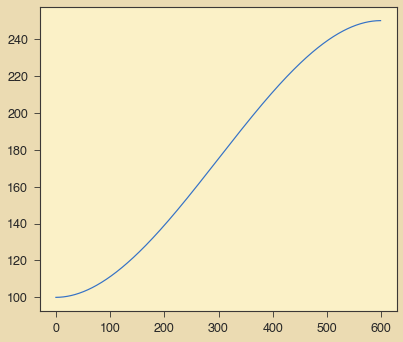

In [448]:
# obsn becomes a list of z_add values, starting at 100AU and ending at 250AU
obsn = [100]
u = 300
o = 0.375
q = (u**2)/o
for i in range(1,600): 
    obsn.append(obsn[-1] + ((1/(q*-1))*(i-u)**2 + o))
pl.plot(range(600),obsn)

In [450]:
# list of coordinates at all needed z_add (heights) for animation
moving_tno_obs = [Observer(0,obsn[u]).wcsPoints(all_pos300, start_4, span_4, croppedwcs) for u in range(len(obsn))]
# loading old values (the first 6 years of TNOS and complete Neptune+Uranus orbits) at each height too
oldtno_obs = [Observer(0,obsn[u]).wcsPoints(last6tno_pos_4, 2013,6, croppedwcs) for u in range(len(obsn))]
oldnu_obs = [Observer(0,obsn[u]).wcsPoints(fullp_pos_4[:2], 1854, 165, croppedwcs) for u in range(len(obsn))]

### Act 4 Scene 5
#####  300 year section, gradually raising the camera

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

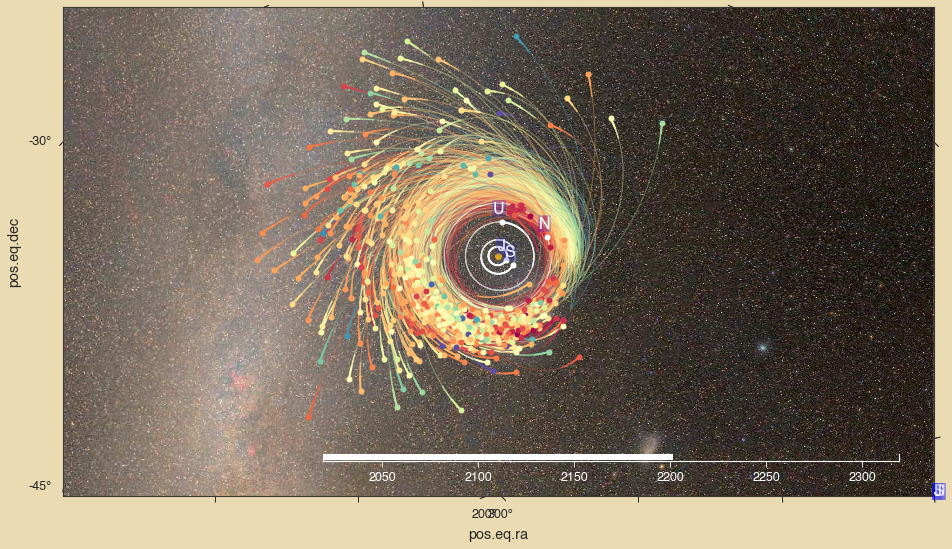

In [451]:
fig = pl.figure(figsize=(16,9))

# project cropped mellenger image
ax = pl.subplot(projection=croppedwcs)
ax.imshow(croppedmel)

# formatting
ax.autoscale(False)
ax.set_xlim(ax.get_xlim()[::-1])
ax.coords[0].set_format_unit('deg', decimal=True)
# plot the Timeline
tl300.plot(ax,0.36,0.18)
# fill the time that has already passed in previous scene
for i in range(125): #125 = # of frames in act4scene4
    tl300.time(i,1200)
    
ax.plot(sunx,suny, 'o', color='goldenrod', markersize=7)
 
points = [ax.plot([], [], '-', lw=2, color=all_colors[i])[0] for i in range(len(allorbs+letter_list))]
letters = [ax.text(0, 0, letter_list[i], fontsize=16, 
                   color='white', bbox={'facecolor': 'blue', 'alpha': 0.2, 'pad': 1}) for i in range(len(letter_list))]

# 3 sets of "Line2D" objects, differing alpha and lw
points1 = [ax.plot([], [], '-', lw=2, color=all_colors[i], alpha=1)[0] for i in range(len(allorbs+letter_list))]
points2 = [ax.plot([], [], '-', lw=1.5, color=all_colors[i], alpha=0.8)[0] for i in range(len(allorbs+letter_list))]
points3 = [ax.plot([], [], '-', lw=1, color=all_colors[i], alpha=0.4)[0] for i in range(len(allorbs+letter_list))]
# "old" trails (first 6 years TNO, complete Neptune and Uranus orbits)
nu_trail = [ax.plot([], [], '-', lw=1, color='white', alpha=0.4)[0] for i in range(len(letter_list[:2]))]
tno_trail = [ax.plot([], [], '-', lw=1, color=all_colors[i], alpha=0.4)[0] for i in range(len(allorbs))]


def init():
    return points

def animate(i):
    nu_trail[0].set_data(oldnu_obs[i][0][0], oldnu_obs[i][1][0])
    nu_trail[1].set_data(oldnu_obs[i][0][1], oldnu_obs[i][1][1])
    for o in range(len(allorbs+letter_list)):   
        xs = moving_tno_obs[i][0][o][:(125+i)]
        ys = moving_tno_obs[i][1][o][:(125+i)]
        
        # set different amounts of data to each "Line2D"
        points1[o].set_data(xs[-50:], ys[-50:])
        points2[o].set_data(xs[-100:], ys[-100:])
        points3[o].set_data(xs, ys)
        points_t0[o].set_data(xs[-1:], ys[-1:])
        
        if o > 717:
            xs = moving_tno_obs[i][0][o][:(125+i)]
            ys = moving_tno_obs[i][1][o][:(125+i)]
            letters[o-718].set_position((xs[-1:]+10, ys[-1:]+10))
        else:
            tno_trail[o].set_data(oldtno_obs[i][0][o], oldtno_obs[i][1][o])
            
    tl300.time(i+125, 1200)
    print(i)
    return points

Writer = animation.writers['ffmpeg']
writer = Writer(fps=(60), metadata=dict(artist='Me'), bitrate=-1)

ani = animation.FuncAnimation(fig, animate, frames=600, init_func=init, blit=True) #600
ani.save("a4s5.mp4", writer=writer, dpi=80)
Video("a4s5.mp4")

### Act 4 Scene 6
##### Finish drawing 300 years with still camera

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

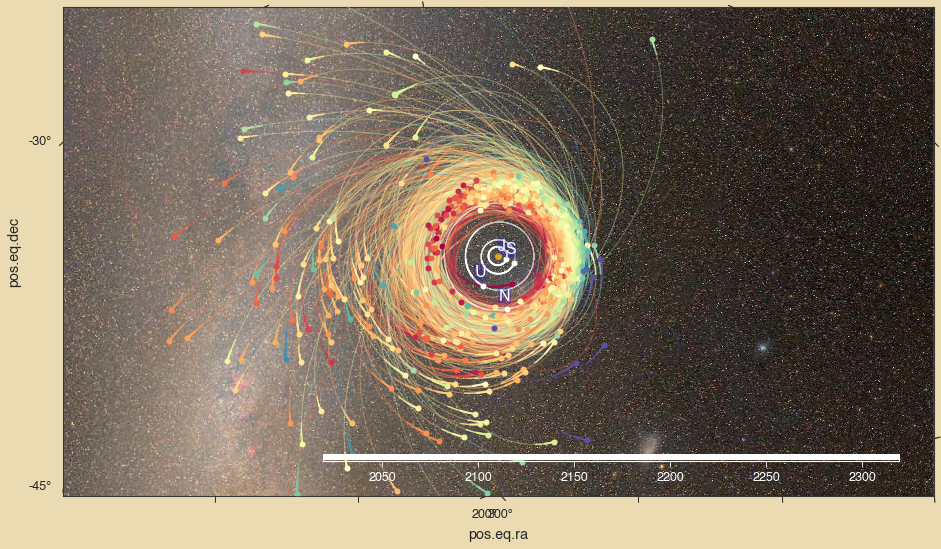

In [452]:
fig = pl.figure(figsize=(16,9))

# project cropped mellenger image
ax = pl.subplot(projection=croppedwcs)
ax.imshow(croppedmel)

# formatting
ax.autoscale(False)
ax.set_xlim(ax.get_xlim()[::-1])
ax.coords[0].set_format_unit('deg', decimal=True)
# plot and fill the Timeline
tl300.plot(ax,0.36,0.18)
for i in range(725):
    tl300.time(i,1200)
    
ax.plot(sunx,suny, 'o', color='goldenrod', markersize=7)
 
# 3 sets of "Line2D" objects, differing alpha and lw
points1 = [ax.plot([], [], '-', lw=2, color=all_colors[i], alpha=1)[0] for i in range(len(allorbs+letter_list))]
points2 = [ax.plot([], [], '-', lw=1.5, color=all_colors[i], alpha=0.8)[0] for i in range(len(allorbs+letter_list))]
points3 = [ax.plot([], [], '-', lw=1, color=all_colors[i], alpha=0.4)[0] for i in range(len(allorbs+letter_list))]

points_t0 = [ax.plot([], [], 'o', markersize=6, color=all_colors[i])[0] for i in range(len(allorbs+letter_list))]
letters = [ax.text(0, 0, letter_list[i], fontsize=16, 
                   color='white', bbox={'facecolor': 'blue', 'alpha': 0.2, 'pad': 1}) for i in range(len(letter_list))]

nu_trail = [ax.plot(oldnu_obs[599][0][i], oldnu_obs[599][1][i], '-', lw=1, color='white', alpha=0.4)[0] for i in range(len(letter_list[:2]))]
tno_trail = [ax.plot(oldtno_obs[599][0][i], oldtno_obs[599][1][i], '-', lw=1, color=all_colors[i], alpha=0.4)[0] for i in range(len(smallorbs))]


def init():
    return points

def animate(i):
    for o in range(len(allorbs+letter_list)): 
        xs = moving_tno_obs[599][0][o][:(725+i)]
        ys = moving_tno_obs[599][1][o][:(725+i)]
        
        # set different amounts of data to each "Line2D"
        points1[o].set_data(xs[-50:], ys[-50:])
        points2[o].set_data(xs[-100:], ys[-100:])
        points3[o].set_data(xs, ys)
        points_t0[o].set_data(xs[-1:], ys[-1:])
        
        if o > 717:
            xs = moving_tno_obs[599][0][o][:(725+i)]
            ys = moving_tno_obs[599][1][o][:(725+i)]
            letters[o-718].set_position((xs[-1:]+10, ys[-1:]+10))

    tl300.time(i+725, 1200)
    print(i)
    return points

Writer = animation.writers['ffmpeg']
writer = Writer(fps=(60), metadata=dict(artist='Me'), bitrate=-1)

ani = animation.FuncAnimation(fig, animate, frames=475, init_func=init, blit=True)
ani.save("a4s6.mp4", writer=writer, dpi=80)
Video("a4s6.mp4")

    1000 year span, lifting and drawing again
    update inter to 1!

899.9938461538458


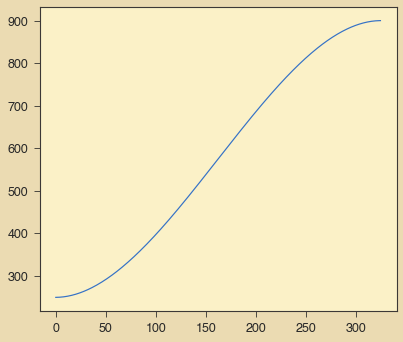

In [384]:
# obsn is a list of z_add values, starting at 250AU and ending at ~900AU
obsn = [250]
tot = 325
u = tot/2
o = 3#0.375
q = (u**2)/o
for i in range(1,tot): 
    obsn.append(obsn[-1] + ((1/(q*-1))*(i-u)**2 + o))
pl.plot(range(tot),obsn)
print(obsn[-1])

In [388]:
neworbs_1 = [Orbit(allIDs[k]) for k in range(len(allIDs))]
start_1 = 2319
span_1 = 1000

# bigger timeline, ~7000 years
tl7000 = Timeline(2000,9319)

infos_1 = [neworbs_1[j].getPath(start_1,span_1) for j in range(len(neworbs_1))]
tnopos_1 = [infos_1[j][4] for j in range(len(neworbs_1))] #positions in (x,y,z)

# planets (Jup-Nep)
ppos_1 = getPlanetPos(['Neptune','Uranus','Saturn','Jupiter'], start_1, span_1)

# combining TNO and planet data to hand to Observer
allpos_1 = tnopos_1 + ppos_1

In [390]:
'''the meat and potatoes!'''

# previously drawn orbits (6 years + 300 years now)
firsttnoinfos_1 = [neworbs_1[j].getPath(2013,306) for j in range(len(neworbs_1))]
firsttno_pos_1 = [firsttnoinfos_1[j][4] for j in range(len(neworbs_1))] #positions in (x,y,z)
fullp_pos = getPlanetPos(['Neptune','Uranus','Saturn','Jupiter'], 1854, 165)

# list of coordinates at all needed z_add (heights) for animation
allobs_1 = [Observer(0,obsn[u]).wcsPoints(allpos_1, start_1, span_1, croppedwcs) for u in range(len(obsn))]

# loading old values at each height too
tno_obs300 = [Observer(0,obsn[u]).wcsPoints(firsttno_pos_1, 2013,306, croppedwcs) for u in range(len(obsn))]

oldnu_obs = [Observer(0,obsn[u]).wcsPoints(fullp_pos[:2], 1854, 165, croppedwcs) for u in range(len(obsn))]

In [397]:
# in order to make one long scene where we keep drawing once the camera is stationary after zooming out -
# append repeats of the last allobs_1, tno_obs300, and oldnu_obs

# "old" data
oldnu_obs_rep = [oldnu_obs[-1]] * 675
tno_obs_rep = [tno_obs300[-1]] * 675
all_tno_obs300 = tno_obs300 + tno_obs_rep
all_nu_obs = oldnu_obs + oldnu_obs_rep

# upcoming data to animate
landing_obs = Observer(0,900).wcsPoints(allpos_1, start_1, span_1, croppedwcs)
landing_obs_rep = [landing_obs] * 675
all_obs_1 = allobs_1 + landing_obs_rep

### Act 4 Scene 7
##### Draw 1000 years (#years 2319 - 3319)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

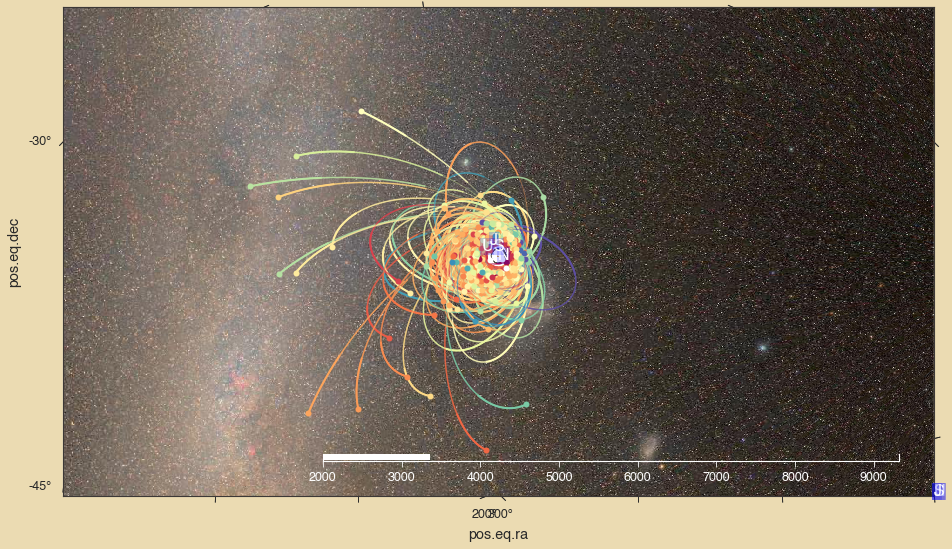

In [428]:
# project cropped mellenger image
fig = pl.figure(figsize=(16,9))
ax = pl.subplot(projection=croppedwcs)
ax.imshow(croppedmel)

# formatting
ax.autoscale(False)
ax.set_xlim(ax.get_xlim()[::-1])
ax.coords[0].set_format_unit('deg', decimal=True)
# plot and fill timeline
tl7000.plot(ax,0.36,0.18)
for i in range(319):
    tl7000.time(i,7319)

ax.plot(sunx,suny, 'o', color='goldenrod', markersize=7)
# 3 sets of "Line2D" objects, differing alpha and lw
points1 = [ax.plot([], [], '-', lw=2, color=all_colors[i], alpha=1)[0] for i in range(len(allorbs+letter_list))]
points2 = [ax.plot([], [], '-', lw=1.5, color=all_colors[i], alpha=0.8)[0] for i in range(len(allorbs+letter_list))]
points3 = [ax.plot([], [], '-', lw=1, color=all_colors[i], alpha=0.4)[0] for i in range(len(allorbs+letter_list))]
nu_trail = [ax.plot([], [], '-', lw=1, color='white', alpha=0.4)[0] for i in range(len(letter_list[:2]))]
tno_trail = [ax.plot([],[], '-', lw=1, color=all_colors[i], alpha=0.4)[0] for i in range(len(allorbs))]

points_t0 = [ax.plot([], [], 'o', markersize=6, color=all_colors[i])[0] for i in range(len(allorbs+letter_list))]
letters = [ax.text(0, 0, letter_list[i], fontsize=16, 
                   color='white', bbox={'facecolor': 'blue', 'alpha': 0.2, 'pad': 1}) for i in range(len(letter_list))]

def init():
    return points

def animate(i):
    nu_trail[0].set_data(all_nu_obs[i][0][0], all_nu_obs[i][1][0])
    nu_trail[1].set_data(all_nu_obs[i][0][1], all_nu_obs[i][1][1])
    for o in range(len(allorbs+letter_list)):   
        xs = all_obs_1[i][0][o][:i]
        ys = all_obs_1[i][1][o][:i]
        points3[o].set_data(xs, ys)
        # increasing the size of tails as we zoom out: increase the "slice"
        # which determines how much data to put in each lw part of tail
        slice1 = min(500, int(50 + (450/325)*i)) 
        slice2 = min(1000, int(100 + (900/325)*i))
        
        if o > 717:
            xs = all_obs_1[i][0][o][:(i+1)]
            ys = all_obs_1[i][1][o][:(i+1)]
            letters[o-718].set_position((xs[-1:][0]+10, ys[-1:][0]+10))
            points_t0[o].set_data(xs[-1:], ys[-1:])
            points1[o].set_data(xs[-slice1:], ys[-slice1:])
            points2[o].set_data(xs[-slice2:], ys[-slice2:])
        else:
            tailsx = np.concatenate((all_tno_obs300[i][0][o], xs))
            tailsy = np.concatenate((all_tno_obs300[i][1][o], ys))
            points_t0[o].set_data(tailsx[-1:], tailsy[-1:])
            points1[o].set_data(tailsx[-slice1:], tailsy[-slice1:])
            points2[o].set_data(tailsx[-slice2:], tailsy[-slice2:])
            tno_trail[o].set_data(all_tno_obs300[i][0][o], all_tno_obs300[i][1][o])
            
    tl7000.time(i+319, 7319)
    print(i)
    return points

Writer = animation.writers['ffmpeg']
writer = Writer(fps=(120), metadata=dict(artist='Me'), bitrate=-1)

ani = animation.FuncAnimation(fig, animate, frames=1000, init_func=init, blit=True) #1000
ani.save("a4s7.mp4", writer=writer, dpi=100)
Video("a4s7.mp4")

    completing orbits: last 6000 years (inter = 0.1)

In [343]:
# combining previous 1306 years of data
# (6 + 300 + 1000)
allorbs_01 = [Orbit(allIDs[k]) for k in range(len(allIDs))]
oldinfos_01 = [allorbs_01[j].getPath(2013,1306) for j in range(len(allorbs))]
oldtno_pos = [oldinfos_01[j][4] for j in range(len(allorbs))]
oldp_pos = getPlanetPos(['Neptune','Uranus','Saturn','Jupiter'], 3154,165)
all_oldpos = oldtno_pos + oldp_pos

oldobs = Observer(0,900).wcsPoints(oldtno_pos, 2013, 1306, croppedwcs)
oldobs_p = Observer(0,900).wcsPoints(oldp_pos, 3154,165, croppedwcs)
oldx = oldobs[0]+oldobs_p[0]
oldy = oldobs[1]+oldobs_p[1]

In [341]:
start_01 = 3320
span_01 = 6000

infos_01 = [allorbs_01[j].getPath(start_01,span_01) for j in range(len(allorbs))]
tnopos_01 = [infos_01[j][4] for j in range(len(allorbs))] #positions in (x,y,z)

# planets (Jup-Nep)
planetpos_01 = getPlanetPos(['Neptune','Uranus','Saturn','Jupiter'], start_01, span_01)

# combining TNO and planet data to hand to Observer
allpos_01 = tnopos_01 + planetpos_01
allobs_01 = Observer(0,900).wcsPoints(allpos_01, start_01, span_01, croppedwcs)

### Act 4 Scene 8
##### Last chunk! Finish drawing the 6000 years of data

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

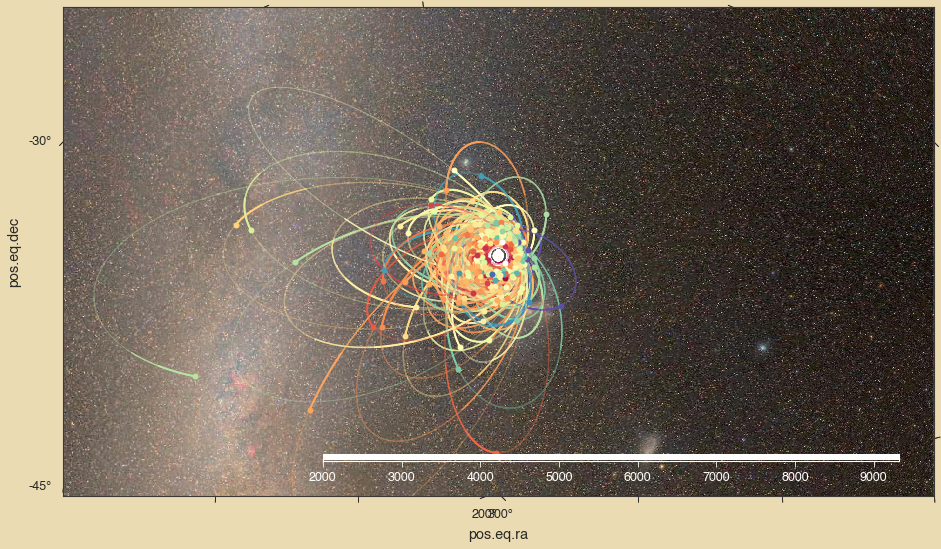

In [366]:
# years 3319 - 9319
fig = pl.figure(figsize=(16,9))

# project cropped mellenger image
ax = pl.subplot(projection=croppedwcs)
ax.imshow(croppedmel)

# formatting
ax.autoscale(False)
ax.set_xlim(ax.get_xlim()[::-1])
ax.coords[0].set_format_unit('deg', decimal=True)

# plot and fill timeline
tl7000.plot(ax,0.36,0.18)
for i in range(149):
    tl7000.time(i,749)
    
ax.plot(sunx,suny, 'o', color='goldenrod', markersize=7)
 
# 3 sets of "Line2D" objects, differing alpha and lw
points1 = [ax.plot([], [], '-', lw=2, color=all_colors[i], alpha=1)[0] for i in range(len(allorbs+letter_list))]
points2 = [ax.plot([], [], '-', lw=1.5, color=all_colors[i], alpha=0.8)[0] for i in range(len(allorbs+letter_list))]
points3 = [ax.plot([], [], '-', lw=1, color=all_colors[i], alpha=0.4)[0] for i in range(len(allorbs+letter_list))]

points_t0 = [ax.plot([], [], 'o', markersize=6, color=all_colors[i])[0] for i in range(len(allorbs+letter_list))]
# make blank lists for coordinate data, include the previously drawn values
xdata = [[] for i in range(len(allorbs+letter_list))]
ydata = [[] for i in range(len(allorbs+letter_list))]
for k in range(len(allorbs+letter_list)):
    for u in range(len(oldx[k])):
        xdata[k].append(oldx[k][u])
        ydata[k].append(oldy[k][u])
        

def init():
    return points

def animate(i):
    for o in range(len(allorbs+letter_list)):   
        x = allobs_01[0][o][i]
        y = allobs_01[1][o][i]
        xdata[o].append(x)
        ydata[o].append(y)
        # set different amounts of data to each "Line2D"
        points1[o].set_data(xdata[o][-50:], ydata[o][-50:])
        points2[o].set_data(xdata[o][-100:], ydata[o][-100:])
        points3[o].set_data(xdata[o], ydata[o])
        points_t0[o].set_data(x, y)
            
    tl7000.time(i+149, 749)
    print(i)
    return points

Writer = animation.writers['ffmpeg']
writer = Writer(fps=(60), metadata=dict(artist='Me'), bitrate=1800)

ani = animation.FuncAnimation(fig, animate, frames=600, init_func=init, blit=True)
ani.save("a4s8.mp4", writer=writer, dpi=80)
Video("a4s8.mp4")